Before you run this notebook make sure you change the Runtime to GPU - The script requires the use of CUDA

To run this script, you will need access to the roboflow dataset. It is easiest to save it to your drive.

In [ ]:
#Use this to mount your google drive. Handy for uploading files.

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -rv /content/drive/MyDrive/tracking_project/working_dir/v2/run3/* /content

'/content/drive/MyDrive/tracking_project/working_dir/v2/run3/coco_eval' -> '/content/coco_eval'
'/content/drive/MyDrive/tracking_project/working_dir/v2/run3/coco_eval/coco_instances_results.json' -> '/content/coco_eval/coco_instances_results.json'
'/content/drive/MyDrive/tracking_project/working_dir/v2/run3/coco_eval/instances_predictions.pth' -> '/content/coco_eval/instances_predictions.pth'
'/content/drive/MyDrive/tracking_project/working_dir/v2/run3/output' -> '/content/output'
'/content/drive/MyDrive/tracking_project/working_dir/v2/run3/output/coco_instances_results.json' -> '/content/output/coco_instances_results.json'
'/content/drive/MyDrive/tracking_project/working_dir/v2/run3/output/events.out.tfevents.1629676121.f2a1d50cd37d.75.0' -> '/content/output/events.out.tfevents.1629676121.f2a1d50cd37d.75.0'
'/content/drive/MyDrive/tracking_project/working_dir/v2/run3/output/events.out.tfevents.1629676212.f2a1d50cd37d.75.1' -> '/content/output/events.out.tfevents.1629676212.f2a1d50cd37

In [ ]:
# You will need to re-name these variables to point to the path of the relevant files
testvids = {
    '/content/drive/MyDrive/tracking_project/test_vid1.mp4': 41,
    '/content/drive/MyDrive/tracking_project/test_vid2.mp4': 34,
    '/content/drive/MyDrive/tracking_project/test_vid3.mp4': 57,
    '/content/drive/MyDrive/tracking_project/test_vid4.mp4': 24
} 

#Install Dependencies and Import Modules

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab
#Install detectron 2
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 42.7 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 12.2 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=7c0e419e276fe144652ed215520f0

#Load in Dataset from Roboflow

Uses these cells to register the datasets with Detectron2. Change the filepaths as necessary.

In [ ]:
# Registering the new dataset
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/tracking_project/working_dir/v2/train/_annotations.coco.json", "/content/drive/MyDrive/tracking_project/working_dir/v2/train")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/tracking_project/working_dir/v2/valid/_annotations.coco.json", "/content/drive/MyDrive/tracking_project/working_dir/v2/valid")
register_coco_instances("my_dataset_test", {}, "/content/drive/MyDrive/tracking_project/working_dir/v2/test/_annotations.coco.json", "/content/drive/MyDrive/tracking_project/working_dir/v2/test")

In [ ]:
# Registering the original dataset
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train2", {}, "/content/drive/MyDrive/tracking_project/working_dir/v1/train/_annotations.coco.json", "/content/drive/MyDrive/tracking_project/working_dir/v1/train")
register_coco_instances("my_dataset_val2", {}, "/content/drive/MyDrive/tracking_project/working_dir/v1/valid/_annotations.coco.json", "/content/drive/MyDrive/tracking_project/working_dir/v1/valid")
register_coco_instances("my_dataset_test2", {}, "/content/drive/MyDrive/tracking_project/working_dir/v1/test/_annotations.coco.json", "/content/drive/MyDrive/tracking_project/working_dir/v1/test")

# Train using Detectron 2

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
# This cell can be run to load up the necessary parameters for inference and tracking if returning after a colab timeout
# If training then skip this cell
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))                                                                                                            

cfg.DATALOADER.NUM_WORKERS = 4

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 2150 #adjust up if val mAP is still rising, adjust down if overfit (default = 1500), best so far 2150
cfg.SOLVER.STEPS = [] #(1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500

'\nos.makedirs(cfg.OUTPUT_DIR, exist_ok=True)\ntrainer = CocoTrainer(cfg)\ntrainer.resume_or_load(resume=False)\n\n\ntrainer.train()\n'

In [ ]:
# Run this cell if actually training a model
# If coming back from colab timeout and about to run evaluation of a model, run this then stop when it says 'starting training from iteration 0'
# from .detectron2.tools.train_net import Trainer
# from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0005 #change up to increase training speed and down to stop loss jumping around as much


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 2900 #adjust up if val mAP is still rising, adjust down if overfit (default = 1500), best so far 2900
cfg.SOLVER.STEPS = [] #(1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)


trainer.train()


[08/23 13:16:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

KeyboardInterrupt: ignored

In [ ]:
# This syncs the output from the training (saved on virtual machine) to google drive for later use
# Use when necessary and change file paths as required
!rsync -av --progress * drive/MyDrive/tracking_project/working_dir/v2/run3 --exclude drive
!cp * drive/MyDrive/tracking_project/working_dir/v2/run3

sending incremental file list
coco_eval/
coco_eval/coco_instances_results.json
      1,462,243 100%  151.47MB/s    0:00:00 (xfr#1, to-chk=11/15)
coco_eval/instances_predictions.pth
        708,619 100%   35.57MB/s    0:00:00 (xfr#2, to-chk=10/15)
output/
output/events.out.tfevents.1629392949.ee8622875a67.74.0
        126,833 100%    6.37MB/s    0:00:00 (xfr#3, to-chk=9/15)
output/last_checkpoint
             15 100%    0.77kB/s    0:00:00 (xfr#4, to-chk=8/15)
output/metrics.json
         81,198 100%    2.87MB/s    0:00:00 (xfr#5, to-chk=7/15)
output/model_final.pth
    835,155,437 100%  171.36MB/s    0:00:04 (xfr#6, to-chk=6/15)
sample_data/
sample_data/README.md
            930 100%    1.38kB/s    0:00:00 (xfr#7, to-chk=5/15)
sample_data/anscombe.json
          1,697 100%    2.52kB/s    0:00:00 (xfr#8, to-chk=4/15)
sample_data/california_housing_test.csv
        301,141 100%  434.39kB/s    0:00:00 (xfr#9, to-chk=3/15)
sample_data/california_housing_train.csv
      1,706,430 100%    2.

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

These graphs detail the performance of the network with increasing iterations. We want to ensure the network does not overfit, so we stop training at the point where AP increase and loss decrease begin to level off  

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = None  #this doesn't seem to change anything because the mAP and AR are averaged over all score thresholds I believe
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test2", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test2")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [08/23 13:19:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/23 13:19:42 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/drive/MyDrive/tracking_project/working_dir/v1/test/_annotations.coco.json
[08/23 13:19:42 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    fly     | 0            |    fly     | 3273         |
|            |              |            |              |
|   total    | 3273         |            |              |
[08/23 13:19:42 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[08/23 13:19:42 d2.data.common]: Serialized dataset takes 0.12 MiB
[08/23 13:19:42 d2.evaluation.evaluator]: Start inference on 100 images
[08/23 13:19:49 d2.evaluation.evaluator]: Inference done 11/100. 0.5950 s / img. ETA=

OrderedDict([('bbox',
              {'AP': 57.595082236052356,
               'AP-fly': 57.595082236052356,
               'AP50': 96.62655976806046,
               'AP75': 58.65864489717818,
               'APl': nan,
               'APm': nan,
               'APs': 57.595082236052356})])

#Inference with Detectron 2
Draw bounding boxes for flies in test videos.

In [ ]:
cfg.MODEL.WEIGHTS = "/content/output/model_final.pth" # This loads the required model
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model - change as required
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test") #sets metadata such as class names
#test_metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])
print(test_metadata)

Metadata(evaluator_type='coco', image_root='/content/drive/MyDrive/tracking_project/working_dir/v2/test', json_file='/content/drive/MyDrive/tracking_project/working_dir/v2/test/_annotations.coco.json', name='my_dataset_test')


32


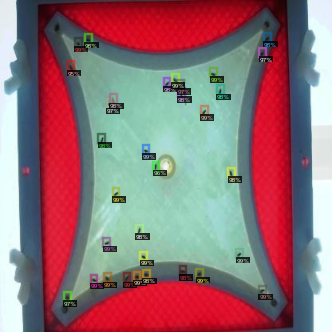

33


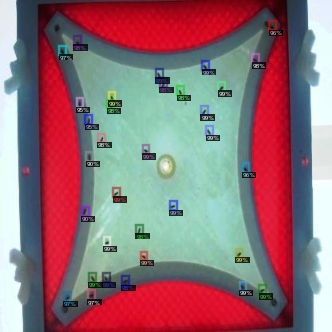

33


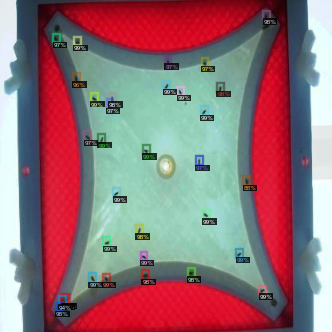

32


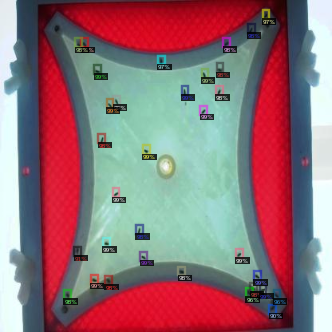

33


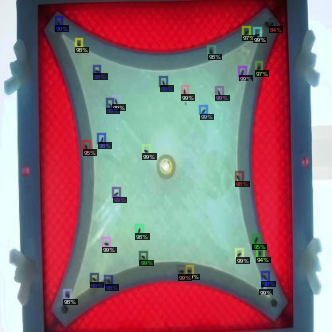

33


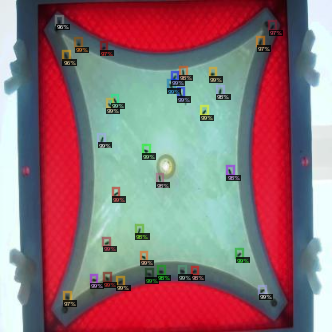

33


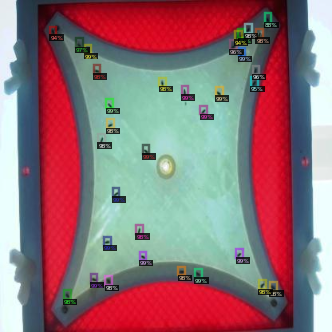

33


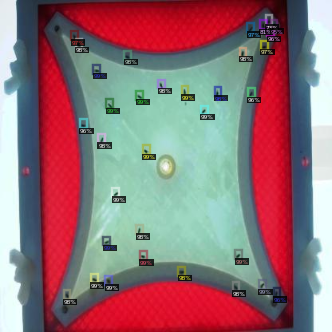

32


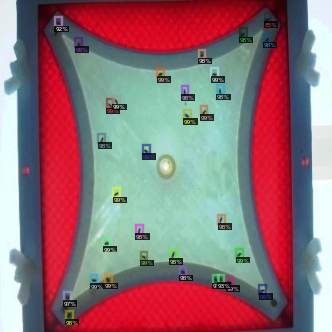

32


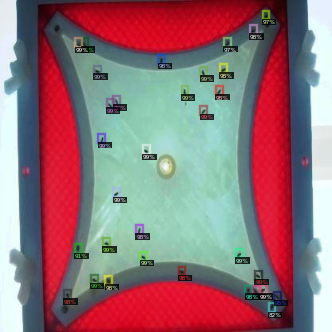

33


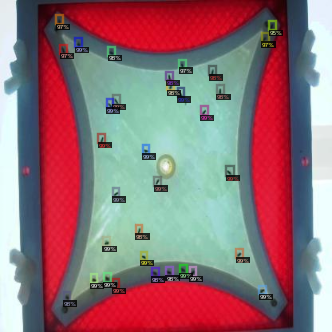

31


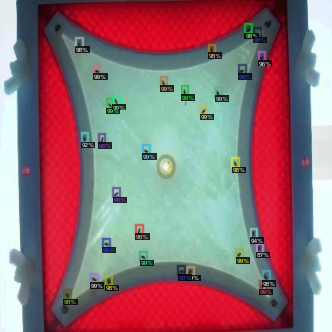

32


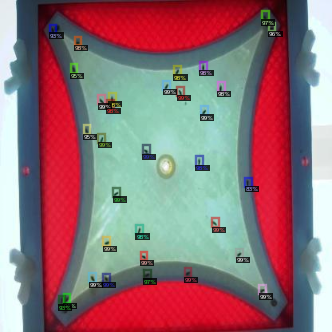

31


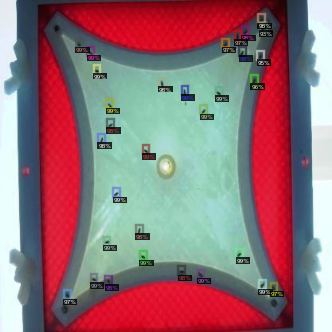

17


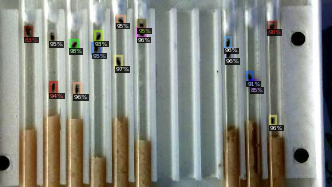

34


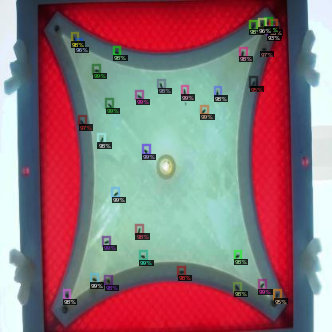

32


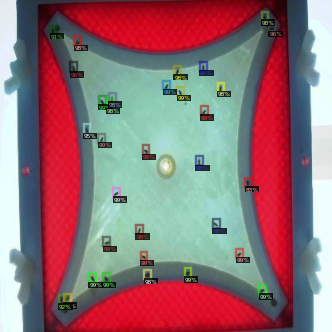

31


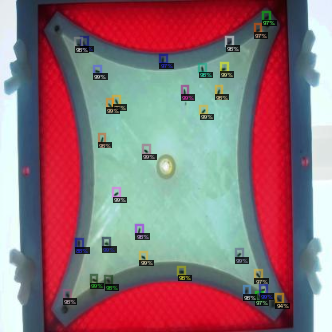

32


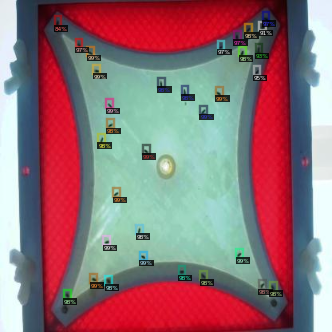

33


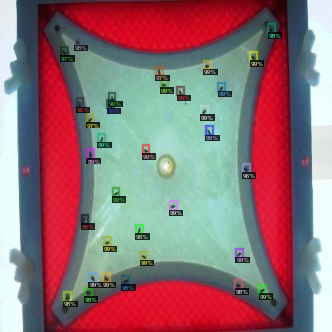

32


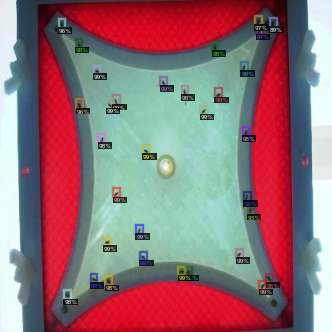

KeyboardInterrupt: ignored

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob
#test_metadata = MetadataCatalog.get("my_dataset_test")
for imageName in glob.glob('/content/drive/MyDrive/tracking_project/working_dir/v2/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  print(len(outputs["instances"].pred_classes))
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  #cv2.imwrite("/content/output/outputim/" + imageName,out.get_image()[:, :, ::-1])


# Image inference with Detectron2

In [ ]:
#This was used to prepare the images to be added to the dataset by initialising annotations then writing them to a file.
#!/usr/bin/env python3
# -- coding: utf-8 --

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import numpy as np
import tqdm
import cv2
import os
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog
import time

# Folder contains images to be tracked - annotations file will be sent there on completion
inf_folder = '/content/drive/MyDrive/20videos/20viddataset/'

# Set size of directory
num_frames = len(os.listdir(inf_folder))

# Initialize predictor
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.55  # set threshold for this model
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/tracking_project/working_dir/output/model_final.pth"
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")


def runOnImage(folder, maxFrames):
    global pred_flies
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """
    pred_flies = []
    readFrames = 0
    for imageName in os.listdir(folder):
        imageName = '/content/drive/MyDrive/20videos/20viddataset/' + imageName
        im = cv2.imread(imageName)
        # Get prediction results for this frame
        outputs = predictor(im)
        pred_flies.append(len(outputs["instances"].pred_classes))

        #Visualize the predictions and print the image
        v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        cv2_imshow(out.get_image()[:, :, ::-1])

        yield out

        readFrames += 1
        if readFrames > maxFrames:
            break

# Create a cut-off for debugging
num_frames = 120

# Enumerate the frames of the video
for out in tqdm.tqdm(runOnImage(inf_folder, num_frames), total=num_frames):
  print(out)
print(pred_flies)

# Release resources
#need to write annotations file somehow
cv2.destroyAllWindows()

AssertionError: ignored

#Video Inference with Detectron2

100%|██████████| 4180/4180 [1:13:40<00:00,  1.06s/it]


Actual count:  41
Predicted count:  40.81650717703349
/content/drive/MyDrive/tracking_project/test_vid1.mp4
[14, 10, 8, 6, 3, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 2, 0, 2, 2, 2, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 2, 3, 2, 2, 2, 2, 0, 1, 1, 1, 1, 0, 1, 3, 3, 3, 3, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 2, 1, 1, 1, 2, 3, 1, 2, 2, 1, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 2, 2, 2, 3, 3, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 2, 2, 2, 3, 2, 2, 2, 3, 2, 3, 2, 1, 2, 2, 1, 2, 1, 4, 2, 0, 0, 0, 2, 2, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 2, 3, 2, 1, 1, 1, 0, 0, 1, 0, 2, 1, 1, 1, 1, 1, 1, 2, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 2, 0, 1, 1, 1, 2, 2, 1, 3, 0, 2, 1, 3, 2, 2, 1, 1, 0, 1, 1, 2, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 3, 1, 3, 3, 2, 2, 3, 2, 2, 0, 1, 2, 1, 1, 1, 0, 0, 1, 1

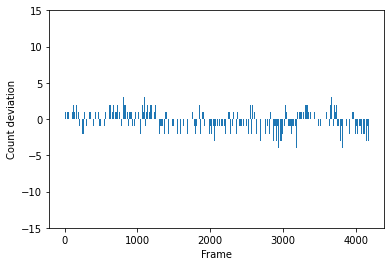

In [ ]:
#Used to perform inference on test videos and output required metrics
#!/usr/bin/env python3
# -- coding: utf-8 --

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import numpy as np
import tqdm
import cv2
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog
import time

# Initialize predictor
#cfg = get_cfg()
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
#cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
#predictor = DefaultPredictor(cfg)

def runOnVideo(video, maxFrames):
    global pred_flies
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """
    pred_flies = []
    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Get prediction results for this frame
        outputs = predictor(frame)
        pred_flies.append(len(outputs["instances"].pred_classes))

        # Make sure the frame is colored
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Draw a visualization of the predictions using the video visualizer
        visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))

        # Convert Matplotlib RGB format to OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break
count = 1
for testvid in testvids.keys():
# Extract video properties
  video = cv2.VideoCapture(testvid)
  width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
  height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
  frames_per_second = video.get(cv2.CAP_PROP_FPS)
  num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Initialize video writer
  video_writer = cv2.VideoWriter('out%d.mp4' % (count), fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)


# Initialize visualizer
  v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), ColorMode.IMAGE)



# Create a cut-off for debugging
  if testvid != '/content/drive/MyDrive/tracking_project/test_vid1.mp4':
    num_frames = 1000
  else:
    num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Enumerate the frames of the video
  for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

    # Write test image
      cv2.imwrite('POSE detectron2.png', visualization)

    # Write to video file
      video_writer.write(visualization)

# Release resources
  video.release()
  video_writer.release()
  cv2.destroyAllWindows()

#Plot graphs
  import matplotlib.pyplot as plt
  
  num_flies = testvids[testvid]

  print('Actual count: ', num_flies)
  print('Predicted count: ', sum(pred_flies)/len(pred_flies))



  corrected_flies = []
  for i in pred_flies:
    corrected_flies.append(i-num_flies)

  abs_dev = []
  for i in corrected_flies:
    abs_dev.append(abs(i))
  
 # print(testvid)
  #print(abs_dev)
  p#rint(len(abs_dev))
  print("Absolute Deviation: ", sum(abs_dev))

  plt.bar(range(0, len(corrected_flies)), corrected_flies)
  plt.ylim([-15,15])
    
  plt.xlabel('Frame')
  plt.ylabel('Count deviation')
  plt.show()

#Download output videos
  from google.colab import files
  files.download('out%d.mp4' % (count))
  count += 1


In [ ]:
#Used to prepare lists for t test calculations
old_vid1 = [7, 3, 3, 4, 3, 0, 2, 2, 0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 1, 0, 1, 2, 1, 2, 2, 0, 1, 1, 0, 1, 2, 1, 1, 2, 2, 1, 1, 2, 2, 2, 1, 2, 1, 1, 2, 2, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 1, 1, 2, 0, 0, 0, 2, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 2, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 2, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 2, 2, 1, 3, 3, 2, 2, 1, 0, 0, 0, 0, 0, 1, 2, 1, 0, 2, 0, 1, 1, 1, 1, 2, 2, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 2, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 2, 2, 2, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 2, 2, 2, 1, 2, 2, 1, 1, 0, 2, 2, 2, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 2, 2, 2, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 1, 2, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 1, 2, 3, 2, 1, 2, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 1, 0, 1, 1, 2, 2, 2, 2, 2, 0, 1, 0, 1, 1, 2, 1, 2, 2, 2, 1, 1, 1, 1, 1, 0, 1, 1, 2, 2, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 2, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 2, 1, 1, 1, 1, 1, 1, 1, 0, 2, 1, 1, 2, 2, 1, 1, 1, 2, 1, 2, 3, 3, 3, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 0, 0, 0, 0, 1, 0, 2, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 2, 2, 2, 3, 2, 3, 3, 2, 2, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 3, 2, 2, 1, 1, 2, 3, 3, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 2, 2, 1, 1, 2, 1, 1, 0, 1, 0, 0, 1, 2, 2, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 0, 2, 1, 2, 3, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 2, 1, 1, 0, 0, 1, 1, 2, 2, 2, 2, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 3, 3, 3, 3, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 1, 1, 0, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 0, 2, 2, 2, 1, 2, 2, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 2, 1, 2, 2, 0, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 1, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 3, 3, 2, 2, 2, 1, 1, 1, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 4, 3, 3, 3, 1, 1, 3, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 2, 2, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 3, 3, 3, 3, 3, 2, 2, 1, 2, 1, 1, 1, 2, 3, 2, 4, 3, 2, 2, 3, 3, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 3, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 3, 3, 4, 3, 3, 2, 2, 1, 1, 2, 2, 2, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 2, 2, 3, 2, 2, 2, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 2, 2, 2, 1, 1, 2, 0, 1, 1, 1, 0, 1, 1, 0, 1, 2, 2, 2, 2, 2, 1, 1, 0, 2, 1, 1, 1, 0, 0, 1, 1, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 3, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4, 4, 3, 3, 3, 4, 3, 3, 2, 2, 1, 0, 2, 2, 2, 2, 1, 1, 2, 2, 3, 2, 2, 0, 2, 1, 1, 0, 1, 3, 3, 2, 2, 2, 2, 3, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 0, 0, 1, 2, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 3, 2, 1, 2, 0, 0, 2, 1, 1, 2, 3, 2, 2, 2, 2, 3, 3, 3, 3, 2, 3, 3, 4, 4, 4, 3, 3, 2, 3, 2, 3, 3, 3, 2, 3, 2, 2, 1, 2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 2, 1, 1, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 2, 1, 2, 2, 2, 2, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 3, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 2, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 2, 2, 2, 2, 3, 3, 2, 2, 2, 3, 2, 2, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 3, 3, 2, 2, 2, 2, 2, 2, 1, 1, 1, 3, 3, 1, 1, 0, 0, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 3, 1, 0, 1, 1, 1, 1, 2, 0, 1, 1, 1, 0, 1, 1, 2, 1, 1, 0, 0, 0, 1, 2, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 2, 1, 0, 2, 1, 2, 2, 3, 2, 2, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 2, 1, 0, 1, 1, 2, 1, 1, 0, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 2, 0, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 3, 3, 3, 2, 0, 1, 4, 3, 4, 2, 3, 2, 2, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 2, 2, 2, 2, 2, 3, 4, 1, 0, 2, 0, 2, 2, 1, 0, 1, 0, 0, 1, 2, 0, 0, 1, 0, 0, 0, 1, 1, 2, 2, 2, 1, 1, 2, 2, 3, 3, 4, 4, 2, 2, 0, 1, 1, 1, 0, 2, 3, 3, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 2, 2, 3, 3, 4, 3, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 3, 3, 2, 2, 3, 3, 3, 2, 3, 2, 2, 2, 2, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 2, 1, 0, 0, 0, 2, 1, 0, 0, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 2, 1, 2, 2, 2, 3, 3, 2, 2, 3, 3, 3, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1, 2, 2, 1, 3, 4, 3, 3, 3, 1, 3, 4, 2, 3, 2, 2, 1, 2, 2, 2, 3, 1, 2, 1, 1, 2, 1, 0, 0, 1, 1, 2, 3, 1, 1, 3, 3, 3, 3, 2, 2, 3, 5, 4, 4, 4, 2, 3, 2, 4, 3, 3, 3, 2, 3, 3, 3, 4, 5, 5, 5, 3, 4, 4, 2, 3, 4, 3, 2, 2, 3, 4, 4, 4, 2, 2, 2, 3, 3, 3, 3, 3, 3, 4, 2, 2, 2, 2, 2, 2, 3, 1, 1, 1, 0, 1, 1, 2, 2, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 1, 2, 1, 2, 2, 2, 3, 3, 3, 1, 0, 0, 1, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 3, 3, 3, 3, 2, 2, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 2, 2, 2, 1, 1, 1, 1, 0, 1, 0, 2, 2, 4, 3, 2, 2, 3, 2, 3, 2, 2, 2, 3, 3, 3, 2, 1, 2, 3, 2, 2, 3, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 1, 3, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 1, 1, 1, 1, 2, 1, 2, 3, 3, 3, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 2, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 2, 1, 2, 3, 2, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 1, 1, 0, 1, 0, 1, 1, 1, 2, 2, 1, 0, 1, 1, 1, 1, 1, 3, 3, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 1, 3, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 0, 0, 0, 0, 0, 2, 3, 3, 2, 2, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 3, 3, 3, 1, 1, 1, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 3, 3, 1, 1, 0, 1, 3, 1, 1, 1, 0, 0, 1, 0, 2, 2, 2, 2, 1, 3, 3, 3, 3, 3, 3, 4, 2, 2, 2, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 2, 3, 2, 2, 3, 3, 1, 2, 1, 1, 2, 2, 2, 2, 2, 4, 3, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 2, 2, 2, 2, 3, 1, 1, 0, 2, 1, 1, 1, 2, 1, 1, 2, 2, 3, 3, 2, 1, 0, 1, 2, 0, 2, 2, 2, 3, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 3, 3, 3, 1, 3, 1, 1, 3, 3, 2, 3, 3, 5, 4, 1, 1, 1, 1, 0, 0, 0, 0, 1, 2, 3, 2, 3, 2, 2, 2, 1, 1, 2, 1, 1, 1, 0, 1, 2, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 2, 1, 1, 1, 1, 1, 2, 3, 2, 2, 1, 1, 2, 2, 3, 4, 6, 5, 4, 4, 4, 3, 2, 3, 2, 2, 2, 3, 3, 3, 2, 2, 1, 1, 3, 2, 2, 3, 4, 3, 3, 3, 3, 3, 3, 3, 2, 3, 2, 2, 2, 3, 3, 3, 2, 3, 3, 1, 2, 2, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 2, 2, 1, 2, 1, 3, 3, 3, 4, 2, 1, 2, 2, 1, 1, 1, 3, 5, 3, 2, 4, 3, 2, 3, 2, 1, 1, 3, 3, 3, 3, 2, 3, 2, 4, 4, 3, 3, 3, 3, 4, 5, 3, 4, 2]
new_vid1 = [14, 10, 8, 6, 3, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 2, 0, 2, 2, 2, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 2, 3, 2, 2, 2, 2, 0, 1, 1, 1, 1, 0, 1, 3, 3, 3, 3, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 2, 1, 1, 1, 2, 3, 1, 2, 2, 1, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 2, 2, 2, 3, 3, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 2, 2, 2, 3, 2, 2, 2, 3, 2, 3, 2, 1, 2, 2, 1, 2, 1, 4, 2, 0, 0, 0, 2, 2, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 2, 3, 2, 1, 1, 1, 0, 0, 1, 0, 2, 1, 1, 1, 1, 1, 1, 2, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 2, 0, 1, 1, 1, 2, 2, 1, 3, 0, 2, 1, 3, 2, 2, 1, 1, 0, 1, 1, 2, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 3, 1, 3, 3, 2, 2, 3, 2, 2, 0, 1, 2, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 3, 2, 2, 1, 2, 2, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 2, 3, 3, 3, 2, 2, 3, 2, 3, 3, 3, 3, 3, 3, 2, 2, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 2, 2, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 2, 2, 1, 1, 0, 1, 2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 2, 1, 1, 0, 1, 1, 1, 2, 1, 1, 0, 2, 2, 2, 1, 1, 1, 2, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 0, 1, 2, 1, 2, 0, 0, 0, 1, 1, 1, 2, 2, 1, 2, 2, 2, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 3, 2, 2, 2, 3, 1, 2, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 1, 2, 1, 0, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 1, 1, 2, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 1, 0, 1, 1, 1, 1, 1, 2, 3, 3, 2, 1, 3, 2, 3, 3, 3, 2, 2, 3, 1, 2, 1, 2, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 2, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 2, 1, 1, 1, 1, 1, 0, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 3, 2, 1, 1, 2, 3, 3, 2, 2, 2, 2, 1, 1, 0, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 2, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 0, 1, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 1, 1, 1, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 1, 0, 0, 1, 2, 2, 1, 3, 3, 3, 3, 1, 1, 1, 1, 2, 2, 1, 2, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 2, 0, 0, 2, 2, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 2, 4, 4, 2, 4, 3, 2, 1, 1, 2, 2, 2, 2, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 3, 3, 2, 1, 2, 2, 2, 2, 3, 3, 3, 3, 2, 2, 2, 2, 1, 0, 1, 1, 0, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 2, 3, 2, 3, 3, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 2, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 1, 0, 2, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 2, 3, 2, 1, 2, 2, 2, 2, 3, 3, 2, 1, 1, 2, 2, 3, 3, 2, 2, 1, 2, 2, 3, 3, 3, 3, 1, 2, 3, 3, 3, 3, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 1, 1, 2, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 2, 0, 1, 2, 2, 2, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 3, 2, 2, 2, 3, 2, 2, 1, 2, 2, 2, 2, 1, 0, 1, 0, 0, 0, 1, 0, 1, 2, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 2, 2, 0, 2, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 2, 2, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 0, 1, 0, 1, 1, 0, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 2, 2, 1, 0, 0, 1, 0, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 2, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 3, 2, 0, 0, 0, 1, 1, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 3, 3, 3, 0, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 2, 2, 1, 0, 0, 1, 2, 2, 1, 0, 1, 1, 0, 1, 2, 1, 1, 0, 0, 1, 1, 3, 2, 2, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 3, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 2, 1, 1, 2, 1, 2, 2, 1, 1, 2, 0, 2, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 2, 2, 3, 3, 3, 3, 1, 1, 1, 1, 1, 2, 3, 2, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 2, 3, 4, 2, 2, 4, 4, 4, 3, 2, 4, 2, 3, 3, 2, 2, 2, 2, 2, 1, 2, 2, 3, 1, 1, 1, 1, 1, 1, 2, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 1, 2, 2, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 2, 1, 0, 2, 1, 1, 1, 0, 1, 1, 0, 2, 2, 2, 1, 2, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 1, 1, 1, 0, 1, 0, 1, 2, 3, 3, 3, 1, 1, 2, 2, 0, 1, 2, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 2, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 2, 1, 1, 1, 1, 1, 0, 1, 1, 2, 2, 3, 2, 0, 2, 1, 0, 0, 1, 1, 1, 2, 1, 2, 1, 2, 1, 1, 1, 2, 0, 0, 2, 1, 2, 2, 3, 2, 2, 1, 2, 1, 2, 1, 2, 1, 1, 2, 3, 1, 2, 2, 2, 3, 3, 3, 3, 2, 2, 2, 2, 2, 3, 1, 1, 2, 1, 1, 3, 3, 2, 2, 3, 3, 3, 1, 3, 2, 2, 2, 2, 3, 3, 3, 3, 1, 2, 1, 0, 0, 1, 2, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 2, 2, 3, 1, 2, 1, 2, 2, 1, 2, 1, 2, 1, 1, 1, 2, 3, 3, 3, 2, 1, 1, 1, 2, 1, 0, 0, 0, 0, 2, 2, 1, 1, 2, 2, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 1, 2, 0, 1, 2, 1, 0, 0, 0, 0, 1, 2, 1, 2, 2, 0, 0, 0, 1, 0, 0, 1, 2, 1, 0, 1, 2, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 2, 2, 2, 2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 2, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 2, 2, 2, 2, 0, 1, 1, 2, 1, 1, 1, 2, 0, 0, 1, 2, 2, 1, 1, 0, 1, 0, 0, 0, 1, 2, 1, 2, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 2, 1, 0, 0, 0, 0, 1, 1, 0, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 3, 2, 2, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 2, 1, 1, 3, 2, 2, 2, 2, 0, 3, 1, 1, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 2, 1, 0, 2, 3, 2, 2, 1, 1, 1, 1, 3, 3, 1, 2, 2, 2, 2, 1, 1, 1, 0, 1, 1, 2, 2, 1, 0, 2, 2, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 2, 0, 0, 0, 1, 0, 2, 1, 2, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 1, 1, 1, 0, 0, 2, 2, 2, 2, 1, 2, 2, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 2, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 2, 2, 3, 3, 3, 3, 2, 1, 1, 1, 2, 2, 1, 1, 2, 1, 0, 1, 1, 2, 2, 3, 2, 1, 1, 1, 2, 2, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 2, 1, 2, 2, 2, 2, 0, 0, 0, 1, 1, 1, 0, 1, 2, 3, 0, 0, 1, 3, 2, 3, 3, 2, 2, 1, 2, 2, 2, 3, 2, 3, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 2, 1, 2, 2, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 2, 2, 2, 1, 1, 2, 2, 2, 3, 4, 4, 4, 3, 3, 2, 3, 3, 4, 4, 3, 2, 2, 2, 2, 1, 1, 0, 1, 1, 1, 2, 0, 2, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 2, 2, 2, 2, 1, 1, 2, 1, 0, 0, 0, 0, 1, 1, 1, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 1, 0, 1, 1, 3, 2, 2, 1, 1, 1, 0, 3, 2, 1, 2, 1, 0, 0, 0, 2, 2, 3, 1, 2, 1, 1, 1, 2, 1, 0, 1, 2, 1, 1, 0, 0, 0, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 2, 3, 2, 2, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 0, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 1, 2, 2, 2, 0, 0, 0, 1, 0, 0, 1, 1, 2, 2, 1, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 3, 3, 2, 2, 2, 1, 2, 2, 2, 2, 3, 1, 1, 2, 1, 2, 2, 3, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 3, 2, 3, 1, 2, 3, 2, 1, 2, 3, 3, 4, 3, 4, 4, 2, 4, 2, 3, 1, 2, 2, 1, 1, 1, 2, 2, 1, 1, 3, 2, 3, 2, 3, 5, 3, 5, 4, 4, 4, 5, 5, 5, 5, 3, 3, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 3, 4, 4, 3, 2, 3, 2, 2, 2, 3, 3, 2, 5, 4, 2, 3, 3, 3, 4, 4, 4, 5, 4, 3, 2, 2, 2, 3, 3, 1, 3, 2, 0, 1, 1, 1, 2, 2, 3, 4, 2, 2, 2, 2, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1, 2, 0, 0, 1, 1, 1, 2, 2, 3, 2, 2, 2, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 2, 2, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 2, 2, 2, 3, 3, 4, 2, 2, 1, 3, 3, 2, 3, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 0, 1, 0, 1, 1, 2, 3, 3, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 2, 3, 2, 1, 2, 2, 2, 0, 1, 0, 0, 1, 1, 1, 0, 1, 2, 2, 2, 2, 2, 2, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 2, 2, 1, 0, 1, 2, 3, 2, 1, 2, 2, 2, 2, 2, 2, 2, 4, 3, 2, 2, 0, 0, 1, 0, 1, 1, 1, 2, 0, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 2, 2, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 2, 2, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 2, 2, 3, 3, 0, 0, 1, 0, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 0, 1, 1, 1, 1, 3, 3, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 3, 2, 1, 1, 0, 0, 1, 2, 2, 0, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0, 0, 2, 1, 1, 2, 3, 3, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 2, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 2, 2, 1, 1, 1, 0, 0, 0, 2, 3, 2, 1, 0, 0, 2, 2, 2, 2, 2, 1, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 0, 0, 1, 2, 1, 0, 2, 0, 0, 0, 1, 2, 3, 3, 3, 3, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 0, 1, 1, 2, 2, 2, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 2, 2, 3, 1, 2, 3, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 2, 2, 2, 1, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 2, 2, 3, 2, 0, 2, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 2, 1, 2, 1, 2, 1, 2, 2, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 2, 2, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 2, 3, 2, 3, 3, 3, 3, 3, 3, 2, 1, 1, 1, 4, 3, 2, 2, 2, 1, 1, 1, 1, 2, 1, 2, 3, 4, 4, 4, 3, 3, 3, 4, 4, 4, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 1, 0, 1, 1, 1, 1, 2, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 1, 0, 1, 1, 1, 1, 1, 1, 2, 0, 1, 1, 1, 1, 0, 0, 2, 3, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 2, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 2, 1, 1, 0, 1, 0, 1, 1, 2, 2, 2, 3, 2, 1, 3, 2, 2, 2, 2, 1, 1, 3, 2, 2, 2, 3, 2, 2, 2, 1, 2, 3, 2, 3, 3, 3, 1, 2, 1, 1, 2, 2, 2, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 2, 0, 1, 0, 3, 2, 2, 3, 3, 3, 3, 3, 4, 4, 5, 4, 2, 1, 1, 2, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 1, 2, 1, 1, 3, 4, 5, 5, 4, 3, 2, 2, 3, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 3, 2, 2, 1, 0, 1, 1, 1, 1, 2, 2, 3, 1, 1, 1, 1, 2, 3, 4, 5, 5, 5, 3]
old_vid3 = [40, 38, 38, 38, 37, 37, 38, 39, 40, 39, 41, 41, 39, 40, 40, 40, 40, 40, 39, 38, 38, 38, 37, 38, 37, 37, 37, 38, 37, 37, 37, 36, 38, 37, 36, 36, 36, 36, 36, 36, 36, 36, 36, 37, 37, 37, 35, 35, 35, 35, 35, 37, 36, 35, 34, 33, 35, 33, 35, 36, 35, 33, 35, 34, 36, 36, 37, 36, 35, 36, 36, 36, 37, 36, 37, 36, 35, 36, 35, 35, 36, 36, 35, 36, 36, 36, 36, 36, 36, 35, 36, 38, 36, 36, 36, 35, 37, 37, 38, 36, 36, 36, 36, 37, 36, 35, 36, 38, 36, 37, 36, 36, 37, 36, 36, 36, 34, 34, 35, 37, 34, 34, 35, 35, 35, 35, 35, 35, 35, 35, 34, 34, 33, 33, 33, 34, 34, 34, 34, 34, 34, 34, 34, 34, 35, 34, 35, 35, 35, 35, 35, 35, 36, 36, 35, 35, 35, 36, 36, 36, 36, 36, 36, 36, 36, 37, 37, 37, 37, 38, 39, 37, 39, 39, 38, 38, 38, 37, 37, 37, 40, 38, 36, 36, 35, 36, 34, 33, 33, 33, 33, 35, 34, 34, 34, 34, 35, 36, 36, 35, 34, 35, 36, 36, 37, 37, 40, 39, 38, 38, 38, 37, 39, 37, 34, 35, 36, 35, 38, 36, 37, 36, 37, 35, 36, 37, 36, 37, 37, 37, 35, 36, 36, 37, 36, 36, 36, 36, 38, 36, 37, 35, 36, 34, 36, 37, 37, 35, 35, 35, 35, 36, 37, 38, 38, 38, 37, 35, 36, 34, 35, 35, 35, 36, 35, 35, 35, 35, 35, 35, 36, 36, 36, 36, 37, 37, 37, 36, 37, 37, 38, 38, 37, 37, 38, 38, 38, 36, 36, 38, 37, 37, 38, 38, 37, 37, 36, 37, 37, 37, 36, 35, 35, 34, 35, 34, 35, 35, 35, 34, 35, 35, 36, 35, 35, 35, 35, 34, 33, 33, 33, 33, 32, 34, 34, 33, 34, 34, 33, 34, 34, 32, 33, 33, 33, 33, 33, 34, 34, 36, 35, 35, 35, 35, 32, 33, 32, 33, 35, 34, 32, 32, 31, 32, 31, 31, 31, 33, 33, 33, 34, 33, 33, 33, 33, 34, 34, 34, 34, 33, 32, 33, 33, 32, 33, 31, 32, 33, 32, 34, 35, 34, 34, 34, 34, 34, 35, 35, 36, 34, 36, 35, 36, 36, 36, 36, 36, 34, 34, 34, 34, 34, 34, 34, 34, 33, 34, 34, 34, 34, 34, 34, 34, 33, 33, 33, 33, 33, 33, 34, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 33, 31, 33, 33, 33, 33, 33, 33, 31, 33, 33, 33, 33, 33, 33, 32, 34, 34, 33, 31, 31, 32, 30, 31, 31, 31, 31, 31, 31, 31, 32, 31, 31, 32, 32, 31, 31, 33, 32, 32, 31, 32, 31, 31, 31, 31, 31, 32, 31, 31, 31, 31, 31, 31, 31, 31, 32, 31, 33, 32, 31, 31, 32, 31, 30, 31, 32, 32, 30, 31, 32, 32, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 31, 30, 31, 31, 31, 32, 31, 31, 32, 32, 32, 32, 32, 32, 32, 32, 31, 31, 31, 32, 31, 31, 33, 33, 32, 32, 31, 31, 31, 31, 31, 32, 30, 31, 32, 31, 30, 31, 32, 32, 32, 31, 32, 31, 32, 32, 32, 32, 32, 32, 32, 31, 32, 32, 32, 32, 31, 30, 30, 31, 31, 32, 31, 30, 29, 30, 31, 31, 32, 32, 31, 32, 32, 31, 31, 31, 29, 30, 29, 30, 31, 31, 29, 29, 28, 29, 30, 29, 29, 29, 29, 30, 30, 30, 29, 29, 30, 29, 30, 32, 32, 31, 30, 31, 31, 31, 31, 30, 30, 30, 30, 30, 31, 30, 29, 28, 30, 31, 30, 31, 29, 27, 28, 28, 28, 28, 29, 29, 28, 29, 29, 29, 29, 29, 28, 28, 28, 28, 28, 29, 28, 29, 29, 28, 28, 29, 29, 30, 29, 30, 29, 29, 30, 31, 31, 30, 29, 29, 30, 32, 30, 33, 32, 32, 31, 32, 32, 32, 33, 33, 31, 32, 33, 31, 32, 32, 32, 32, 32, 32, 31, 32, 30, 33, 32, 33, 33, 32, 33, 32, 33, 32, 33, 33, 33, 34, 33, 32, 32, 32, 32, 33, 33, 33, 33, 33, 32, 33, 32, 31, 32, 31, 31, 32, 31, 32, 32, 32, 32, 31, 31, 31, 31, 31, 31, 32, 32, 32, 32, 33, 33, 33, 33, 33, 33, 32, 32, 31, 30, 30, 31, 31, 31, 32, 33, 32, 32, 31, 32, 32, 31, 32, 32, 31, 33, 33, 32, 32, 33, 33, 32, 33, 32, 33, 33, 33, 32, 32, 33, 31, 31, 30, 31, 30, 30, 31, 30, 29, 30, 31, 31, 32, 33, 33, 32, 31, 30, 30, 31, 31, 32, 32, 31, 31, 33, 32, 32, 33, 32, 34, 34, 34, 34, 35, 34, 35, 34, 34, 35, 34, 34, 34, 34, 33, 34, 35, 36, 36, 35, 35, 35, 35, 36, 35, 35, 34, 34, 34, 33, 33, 34, 34, 33, 33, 32, 32, 32, 33, 34, 32, 33, 32, 33, 34, 34, 34, 32, 33, 32, 35, 33, 32, 32, 33, 33, 33, 32, 32, 32, 32, 30, 31, 32, 32, 32, 31, 31, 32, 32, 32, 31, 32, 32, 32, 32, 32, 33, 33, 33, 33, 32, 33, 33, 33, 33, 33, 34, 33, 33, 33, 33, 33, 34, 33, 35, 33, 33, 34, 33, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 34, 34, 32, 32, 31, 31, 31, 31, 31, 31, 31, 31, 31, 32, 30, 30, 30, 29, 30, 31, 30, 30, 30, 30, 30, 29, 29, 29, 29, 29, 28, 28, 28, 28, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 30, 30, 29, 29, 29, 30, 31, 31, 30, 30]
old_vid2 = [19, 11, 3, 4, 1, 1, 1, 2, 2, 3, 0, 2, 1, 1, 1, 5, 1, 0, 2, 2, 3, 0, 4, 3, 3, 2, 2, 0, 4, 5, 12, 5, 4, 0, 1, 1, 6, 7, 4, 3, 7, 3, 4, 3, 2, 1, 0, 4, 4, 1, 1, 4, 0, 2, 1, 4, 4, 2, 3, 3, 6, 4, 5, 3, 3, 0, 6, 4, 8, 8, 6, 8, 1, 4, 4, 5, 3, 1, 4, 3, 4, 4, 4, 6, 4, 2, 1, 5, 3, 2, 2, 0, 3, 3, 0, 2, 6, 3, 1, 4, 1, 4, 1, 2, 5, 1, 3, 3, 5, 1, 2, 3, 4, 0, 4, 1, 2, 3, 0, 3, 6, 5, 2, 2, 1, 2, 4, 0, 2, 2, 2, 4, 4, 2, 1, 4, 5, 0, 1, 0, 2, 6, 6, 5, 3, 7, 5, 0, 2, 6, 5, 6, 5, 6, 4, 2, 0, 4, 3, 5, 0, 1, 2, 0, 5, 1, 1, 1, 1, 3, 0, 1, 3, 5, 3, 1, 0, 4, 1, 1, 2, 4, 3, 2, 2, 2, 1, 1, 3, 3, 0, 3, 1, 6, 3, 1, 3, 3, 5, 1, 0, 5, 4, 5, 7, 8, 10, 5, 0, 4, 6, 4, 7, 2, 0, 1, 2, 1, 0, 5, 6, 1, 2, 0, 1, 6, 1, 4, 6, 6, 5, 3, 6, 4, 7, 1, 3, 6, 4, 4, 1, 2, 2, 0, 2, 1, 2, 7, 0, 2, 0, 2, 0, 5, 1, 1, 3, 6, 0, 3, 1, 3, 6, 1, 3, 1, 2, 4, 9, 6, 8, 7, 13, 10, 5, 9, 7, 5, 3, 3, 0, 4, 5, 3, 4, 5, 5, 6, 8, 7, 4, 3, 0, 4, 1, 0, 1, 2, 3, 1, 1, 1, 3, 0, 1, 2, 1, 2, 1, 1, 2, 4, 4, 2, 4, 2, 3, 4, 3, 3, 1, 5, 1, 2, 4, 2, 4, 2, 0, 2, 0, 1, 1, 0, 0, 1, 4, 4, 1, 5, 3, 1, 5, 2, 4, 3, 0, 0, 5, 5, 5, 5, 1, 1, 3, 1, 4, 0, 2, 1, 1, 1, 3, 2, 2, 3, 7, 4, 6, 5, 6, 6, 5, 6, 9, 3, 0, 4, 1, 3, 0, 2, 5, 1, 1, 1, 1, 1, 1, 1, 4, 7, 5, 3, 4, 3, 5, 4, 4, 2, 2, 1, 3, 3, 3, 6, 6, 6, 3, 1, 2, 6, 4, 2, 2, 2, 6, 5, 7, 7, 3, 0, 1, 2, 3, 2, 5, 1, 1, 3, 1, 1, 1, 4, 3, 5, 3, 1, 4, 2, 4, 2, 0, 1, 2, 4, 3, 2, 5, 2, 3, 4, 4, 3, 5, 4, 4, 4, 9, 7, 8, 7, 7, 4, 1, 1, 5, 3, 5, 3, 0, 3, 3, 2, 1, 1, 2, 2, 2, 2, 6, 3, 5, 6, 3, 4, 5, 1, 1, 3, 4, 4, 3, 2, 5, 1, 1, 3, 6, 2, 6, 2, 5, 4, 7, 5, 5, 7, 7, 6, 5, 6, 2, 4, 3, 1, 2, 5, 1, 1, 7, 3, 10, 11, 5, 8, 9, 13, 8, 3, 6, 5, 7, 7, 3, 6, 10, 8, 6, 7, 5, 5, 8, 5, 4, 7, 6, 3, 7, 4, 2, 1, 0, 3, 5, 4, 6, 7, 4, 2, 2, 9, 6, 10, 10, 6, 10, 7, 0, 2, 6, 2, 5, 4, 3, 4, 5, 1, 2, 2, 0, 1, 1, 1, 3, 1, 1, 2, 2, 1, 4, 2, 1, 0, 0, 4, 2, 4, 0, 2, 4, 5, 3, 5, 4, 5, 6, 10, 9, 5, 6, 4, 5, 3, 3, 1, 7, 5, 5, 4, 5, 4, 3, 8, 4, 5, 7, 7, 4, 8, 4, 4, 3, 8, 8, 8, 9, 5, 7, 4, 4, 5, 2, 1, 6, 5, 1, 4, 4, 3, 4, 6, 4, 2, 6, 5, 5, 4, 6, 12, 0, 6, 1, 6, 8, 10, 10, 9, 5, 9, 14, 6, 6, 3, 6, 2, 3, 5, 4, 4, 5, 4, 5, 3, 5, 6, 7, 6, 7, 9, 9, 7, 5, 6, 2, 2, 3, 4, 2, 1, 1, 3, 1, 9, 2, 4, 8, 8, 7, 4, 5, 1, 3, 4, 6, 4, 2, 6, 9, 8, 9, 7, 10, 6, 7, 7, 8, 2, 0, 3, 0, 1, 4, 6, 6, 0, 2, 1, 4, 1, 0, 5, 5, 3, 6, 6, 7, 12, 7, 2, 6, 6, 5, 6, 4, 5, 7, 7, 8, 4, 7, 6, 7, 5, 9, 9, 6, 3, 1, 2, 2, 0, 7, 1, 1, 4, 8, 10, 6, 12, 10, 12, 12, 16, 14, 15, 15, 16, 15, 17, 13, 9, 10, 9, 10, 6, 11, 8, 8, 9, 7, 15, 8, 9, 10, 6, 7, 29, 34, 34, 12, 9, 9, 6, 5, 12, 6, 5, 4, 2, 2, 4, 5, 12, 13, 12, 15, 9, 11, 10, 11, 11, 12, 15, 13, 10, 9, 8, 5, 5, 8, 13, 13, 13, 9, 10, 6, 7, 6, 7, 7, 7, 3, 7, 3, 8, 8, 9, 11, 14, 9, 9, 12, 8, 9, 8, 10, 7, 7, 8, 7, 5, 6, 8, 13, 9, 9, 13, 9, 10, 11, 14, 10, 14, 14, 15, 12, 16, 12, 10, 12, 11, 14, 12, 14, 15, 13, 12, 13, 10, 6, 6, 10, 9, 10, 12, 11, 11, 9, 11, 8, 8, 7, 7, 10, 4, 6, 7, 7, 7, 9, 9, 8, 8, 4, 4, 6, 9, 11, 11, 11, 12, 14, 12, 13, 15, 15, 14, 13, 13, 14, 15, 11, 11, 11, 14, 12, 15, 12, 13, 11, 16, 12, 10, 9, 7, 7, 7, 13, 14, 16, 20, 20, 20, 21, 17, 19, 15, 19, 18, 16, 15, 17, 19, 19, 17, 13, 11, 9, 11, 11, 11, 9, 12, 12, 12, 16, 16, 13, 14, 10, 12, 13, 10, 12, 11, 9, 15, 14, 10, 15]
new_vid3 = [40, 38, 37, 39, 38, 37, 37, 37, 38, 40, 38, 39, 38, 38, 38, 35, 35, 35, 37, 36, 36, 37, 36, 36, 36, 35, 36, 36, 35, 35, 34, 35, 35, 35, 35, 35, 35, 35, 33, 34, 35, 35, 35, 35, 33, 33, 33, 33, 32, 32, 31, 30, 30, 30, 31, 31, 31, 30, 31, 32, 31, 30, 31, 32, 33, 33, 35, 34, 34, 36, 35, 35, 35, 34, 34, 33, 32, 31, 31, 30, 32, 32, 30, 30, 32, 31, 31, 31, 31, 30, 32, 31, 31, 30, 32, 31, 32, 31, 31, 32, 32, 32, 31, 31, 31, 31, 31, 32, 32, 32, 32, 31, 32, 31, 29, 30, 30, 31, 31, 30, 30, 30, 29, 28, 29, 30, 29, 31, 30, 31, 31, 30, 31, 29, 30, 29, 32, 32, 30, 33, 32, 32, 31, 30, 30, 30, 31, 32, 31, 32, 32, 33, 31, 32, 31, 31, 31, 33, 33, 34, 33, 33, 34, 33, 34, 33, 31, 33, 32, 34, 34, 33, 34, 35, 33, 33, 33, 31, 31, 31, 33, 33, 32, 32, 32, 32, 32, 31, 31, 31, 32, 32, 32, 34, 34, 34, 35, 34, 35, 34, 33, 33, 34, 34, 34, 35, 34, 33, 34, 34, 34, 34, 35, 33, 34, 33, 32, 32, 32, 32, 32, 31, 32, 31, 31, 31, 31, 31, 31, 31, 31, 30, 31, 31, 30, 31, 30, 31, 31, 31, 30, 31, 29, 29, 29, 30, 31, 30, 29, 27, 30, 31, 32, 30, 30, 31, 29, 29, 29, 29, 29, 30, 30, 30, 31, 31, 29, 32, 33, 32, 32, 34, 34, 34, 33, 33, 34, 35, 33, 32, 32, 35, 34, 35, 34, 34, 35, 34, 34, 35, 35, 34, 34, 35, 36, 34, 34, 34, 35, 35, 34, 33, 30, 31, 32, 31, 31, 32, 31, 31, 32, 31, 33, 34, 33, 32, 33, 34, 33, 31, 30, 30, 29, 30, 31, 30, 32, 31, 30, 31, 30, 28, 29, 28, 30, 30, 29, 30, 30, 31, 31, 31, 31, 30, 28, 29, 29, 28, 30, 31, 29, 31, 30, 29, 30, 31, 31, 32, 33, 32, 32, 31, 32, 32, 31, 30, 30, 31, 31, 30, 30, 31, 30, 30, 29, 30, 31, 33, 30, 32, 32, 30, 31, 32, 31, 31, 31, 32, 32, 31, 32, 33, 33, 34, 32, 31, 31, 32, 31, 30, 33, 31, 32, 32, 31, 32, 32, 32, 31, 32, 31, 31, 32, 31, 32, 31, 30, 31, 32, 33, 31, 32, 32, 31, 30, 32, 31, 30, 30, 30, 29, 31, 33, 33, 31, 31, 32, 32, 32, 32, 32, 33, 32, 32, 32, 32, 32, 31, 32, 29, 29, 29, 31, 30, 31, 29, 30, 30, 30, 29, 28, 29, 30, 31, 32, 32, 31, 30, 30, 31, 31, 30, 30, 31, 31, 32, 31, 32, 33, 32, 31, 30, 30, 29, 28, 30, 30, 30, 29, 29, 29, 30, 30, 30, 30, 30, 31, 30, 30, 30, 31, 31, 30, 30, 29, 31, 30, 30, 30, 30, 29, 29, 29, 30, 30, 32, 32, 31, 30, 31, 30, 29, 28, 29, 29, 28, 28, 28, 28, 28, 29, 29, 29, 28, 30, 28, 27, 29, 28, 28, 29, 30, 29, 29, 29, 29, 29, 29, 28, 29, 29, 30, 31, 29, 29, 29, 29, 29, 31, 30, 31, 30, 30, 30, 29, 29, 30, 29, 29, 29, 29, 29, 29, 29, 30, 31, 30, 31, 30, 29, 30, 30, 28, 30, 30, 30, 29, 30, 30, 29, 28, 29, 30, 30, 30, 29, 31, 31, 31, 31, 29, 28, 28, 28, 29, 27, 29, 29, 29, 30, 29, 28, 29, 27, 27, 27, 28, 28, 29, 29, 29, 29, 28, 28, 27, 28, 28, 28, 28, 28, 28, 28, 29, 29, 28, 28, 29, 29, 29, 29, 28, 28, 28, 28, 28, 28, 27, 27, 27, 28, 26, 28, 27, 27, 28, 27, 28, 27, 27, 28, 27, 27, 27, 28, 27, 26, 27, 26, 27, 27, 26, 26, 27, 27, 26, 27, 29, 28, 29, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 29, 27, 27, 27, 27, 27, 26, 26, 28, 26, 27, 28, 28, 28, 28, 28, 29, 28, 27, 27, 28, 28, 28, 28, 29, 29, 29, 29, 29, 28, 28, 29, 28, 28, 28, 28, 28, 27, 27, 27, 27, 27, 28, 28, 28, 28, 26, 27, 27, 27, 27, 27, 27, 27, 26, 27, 28, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 28, 28, 28, 28, 28, 28, 29, 27, 28, 29, 29, 29, 27, 28, 28, 28, 29, 28, 28, 28, 28, 29, 31, 31, 31, 31, 30, 30, 30, 30, 31, 29, 30, 30, 30, 29, 29, 29, 29, 30, 30, 30, 31, 29, 30, 29, 29, 29, 31, 29, 28, 28, 27, 28, 28, 28, 30, 31, 30, 29, 30, 30, 29, 29, 29, 29, 29, 28, 29, 30, 30, 30, 30, 32, 31, 31, 32, 32, 30, 31, 31, 31, 33, 33, 33, 31, 31, 32, 30, 30, 31, 32, 31, 32, 32, 31, 32, 32, 32, 33, 32, 33, 33, 33, 32, 32, 32, 32, 31, 31, 32, 30, 30, 31, 30, 31, 31, 30, 29, 30, 30, 31, 32, 32, 31, 29, 28, 31, 30, 30, 32, 31, 31, 31, 30, 32, 30, 29, 30, 30, 29, 30, 30, 27, 28, 28, 28, 28, 29, 29, 29, 29, 30, 30, 29, 30, 30, 30, 30, 30, 30, 31, 30, 30, 31, 31, 31, 32, 31, 31, 31, 30, 31, 31, 31, 31, 31, 30, 30, 31, 31, 31, 30, 30, 30, 29, 29, 30, 30, 30, 29, 29, 29, 29, 29, 30, 28, 27, 27, 28, 27, 28, 28, 27, 26, 26, 27, 27, 29, 27, 28, 28, 28, 27, 28, 27, 27, 27, 27, 27, 27, 27, 26, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 27, 28, 28, 28, 26, 27]
new_vid2 = [5, 6, 4, 7, 5, 3, 3, 4, 3, 3, 2, 3, 5, 3, 5, 5, 4, 4, 4, 6, 6, 5, 3, 4, 4, 4, 2, 1, 1, 1, 0, 2, 0, 1, 0, 1, 1, 2, 6, 5, 4, 0, 5, 8, 6, 5, 2, 5, 3, 2, 5, 4, 5, 3, 5, 4, 7, 5, 9, 7, 5, 4, 6, 10, 6, 5, 6, 6, 9, 11, 11, 10, 10, 7, 7, 6, 3, 5, 10, 10, 8, 7, 3, 7, 6, 8, 5, 8, 5, 8, 3, 6, 6, 7, 4, 6, 8, 9, 4, 3, 2, 2, 2, 5, 4, 7, 2, 5, 4, 6, 6, 3, 6, 1, 5, 6, 4, 4, 3, 4, 5, 3, 4, 5, 2, 7, 3, 5, 5, 7, 5, 5, 6, 5, 3, 4, 4, 3, 1, 0, 3, 4, 3, 4, 2, 2, 2, 2, 4, 4, 3, 0, 2, 2, 2, 3, 3, 3, 1, 1, 2, 1, 1, 0, 0, 1, 1, 0, 4, 6, 2, 2, 4, 3, 2, 2, 1, 2, 4, 1, 0, 0, 1, 2, 3, 2, 3, 3, 3, 1, 5, 5, 6, 4, 3, 4, 4, 5, 4, 5, 5, 3, 4, 7, 4, 2, 3, 5, 3, 3, 3, 5, 4, 3, 7, 6, 4, 4, 7, 5, 7, 6, 6, 6, 5, 3, 3, 4, 3, 0, 1, 2, 4, 4, 4, 4, 4, 5, 2, 2, 2, 1, 2, 1, 1, 1, 0, 1, 2, 2, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 3, 2, 3, 1, 1, 1, 4, 3, 4, 2, 2, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 2, 1, 3, 3, 0, 0, 4, 2, 2, 1, 2, 0, 2, 1, 2, 2, 1, 0, 3, 3, 1, 1, 3, 2, 2, 3, 1, 1, 1, 1, 0, 0, 4, 6, 1, 3, 0, 1, 0, 1, 0, 3, 1, 2, 1, 1, 2, 0, 0, 2, 0, 2, 1, 2, 1, 1, 0, 1, 2, 2, 2, 2, 4, 2, 3, 3, 2, 1, 0, 3, 2, 0, 1, 0, 0, 4, 4, 1, 2, 5, 5, 5, 5, 3, 3, 4, 5, 4, 2, 1, 2, 4, 3, 1, 2, 1, 3, 3, 5, 3, 2, 4, 2, 2, 1, 5, 4, 5, 4, 3, 2, 4, 5, 5, 8, 9, 7, 4, 2, 0, 0, 2, 3, 3, 1, 3, 3, 2, 2, 0, 2, 3, 2, 3, 0, 1, 1, 1, 2, 1, 1, 2, 0, 1, 1, 1, 3, 1, 0, 0, 1, 2, 1, 1, 4, 1, 2, 3, 3, 5, 3, 1, 2, 5, 5, 4, 4, 3, 2, 2, 2, 0, 0, 3, 3, 0, 1, 0, 0, 2, 0, 2, 3, 2, 0, 2, 1, 1, 1, 0, 2, 0, 3, 0, 2, 1, 1, 2, 0, 1, 1, 2, 2, 1, 2, 0, 3, 0, 1, 0, 0, 1, 1, 0, 1, 3, 1, 3, 1, 4, 2, 3, 3, 6, 4, 4, 1, 4, 6, 5, 7, 4, 3, 1, 4, 1, 3, 1, 0, 0, 1, 2, 3, 1, 2, 4, 2, 2, 1, 1, 1, 2, 2, 0, 1, 2, 2, 1, 2, 0, 1, 1, 2, 0, 3, 4, 5, 6, 4, 5, 1, 2, 2, 2, 2, 3, 1, 3, 1, 2, 2, 3, 3, 3, 2, 2, 2, 2, 1, 2, 2, 1, 1, 2, 3, 3, 3, 1, 0, 3, 5, 6, 4, 5, 4, 5, 5, 5, 7, 6, 6, 4, 4, 5, 7, 6, 6, 8, 6, 6, 5, 5, 5, 6, 7, 5, 4, 3, 5, 5, 5, 5, 3, 5, 7, 6, 5, 5, 4, 6, 3, 5, 5, 4, 4, 4, 3, 2, 2, 4, 0, 2, 2, 2, 3, 3, 4, 3, 4, 5, 5, 6, 6, 6, 4, 10, 8, 7, 6, 8, 8, 8, 9, 8, 8, 9, 8, 8, 7, 8, 9, 6, 6, 7, 5, 6, 5, 6, 6, 6, 5, 4, 6, 7, 9, 10, 12, 9, 10, 8, 9, 10, 11, 8, 8, 7, 7, 5, 4, 5, 5, 5, 5, 5, 4, 3, 4, 4, 3, 4, 6, 7, 6, 6, 6, 5, 5, 4, 7, 5, 6, 6, 7, 9, 8, 7, 6, 7, 5, 5, 6, 7, 3, 5, 4, 7, 4, 4, 1, 3, 3, 3, 3, 6, 5, 8, 4, 5, 5, 5, 1, 6, 5, 5, 5, 6, 6, 6, 6, 4, 5, 5, 6, 8, 5, 4, 4, 5, 4, 5, 4, 3, 5, 6, 8, 7, 7, 7, 7, 9, 10, 14, 12, 13, 13, 12, 13, 13, 12, 12, 15, 15, 13, 14, 14, 14, 13, 13, 13, 13, 12, 13, 14, 14, 11, 20, 31, 30, 7, 7, 8, 8, 7, 7, 7, 7, 8, 6, 4, 5, 9, 10, 7, 8, 9, 8, 8, 8, 6, 6, 6, 7, 7, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 4, 4, 2, 3, 4, 4, 3, 5, 5, 7, 6, 6, 7, 8, 6, 7, 5, 7, 7, 5, 5, 5, 6, 6, 4, 3, 2, 4, 3, 3, 4, 5, 5, 7, 7, 6, 5, 5, 4, 3, 6, 3, 5, 4, 4, 5, 5, 6, 5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 4, 3, 5, 2, 4, 6, 4, 4, 6, 6, 7, 6, 3, 4, 4, 3, 4, 4, 2, 3, 5, 6, 5, 5, 6, 5, 9, 10, 12, 11, 7, 5, 8, 7, 6, 8, 6, 5, 7, 5, 5, 4, 5, 6, 5, 4, 5, 5, 7, 6, 6, 5, 5, 6, 8, 8, 8, 10, 10, 9, 4, 6, 6, 7, 6, 6, 6, 5, 4, 4, 6, 5, 5, 4, 3, 4, 5, 4, 4, 3, 4, 3, 4, 3, 2, 3, 3, 6, 5, 5, 5, 4, 4, 7, 6]

import scipy.stats as stats

#perform the paired samples t-test
stats.ttest_rel(old_vid1, new_vid1)

Ttest_relResult(statistic=-6.222032546977295, pvalue=5.389464384344114e-10)

In [ ]:
#Next three cells perform t tests for each video except video 4
stats.ttest_rel(old_vid2, new_vid2)

Ttest_relResult(statistic=9.642165013102785, pvalue=4.246487426623506e-21)

In [ ]:
stats.ttest_rel(old_vid3, new_vid3)

Ttest_relResult(statistic=50.826899588961815, pvalue=2.121602620306141e-279)

#Object Tracking using SORT

usually throws an error - you may have to reset the runtime and re-run this cell. (NOTE: Do not factory reset runtime since you'll loose everything you've generated this session)

In [ ]:
#Before resetting runtime if this throws an error you should try and run it a second time, it sometimes works
!git clone https://github.com/abewley/sort
!pip install filterpy
%cd sort

import matplotlib
matplotlib.use('TKAgg')
from sort import *

Cloning into 'sort'...
remote: Enumerating objects: 202, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 202 (delta 0), reused 0 (delta 0), pack-reused 198
Receiving objects: 100% (202/202), 1.21 MiB | 12.72 MiB/s, done.
Resolving deltas: 100% (69/69), done.
/content/sort/sort


1001it [19:35,  1.17s/it]                          

number of unique IDs 34
Number of flies > threshold:  23
Mean Track Length =  683.4117647058823
Number of flies > threshold:  22
Mean Track Length =  683.4117647058823
Number of flies > threshold:  21
Mean Track Length =  683.4117647058823


1001it [19:39,  1.18s/it]

Number of flies > threshold:  16
Mean Track Length =  683.4117647058823


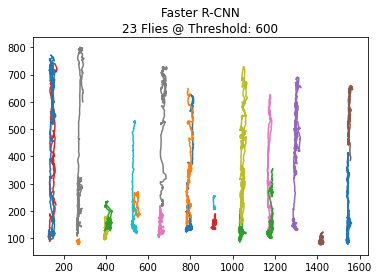

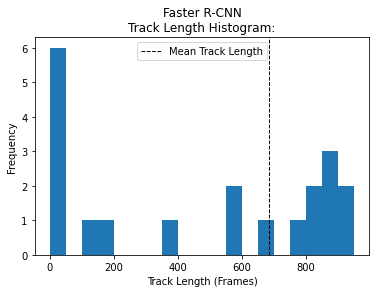

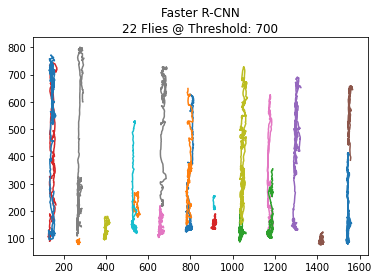

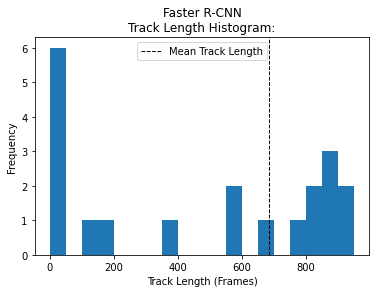

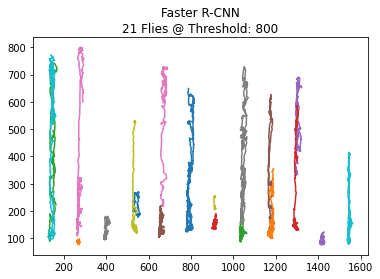

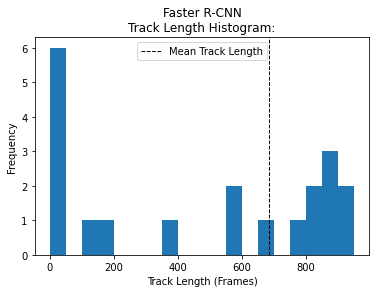

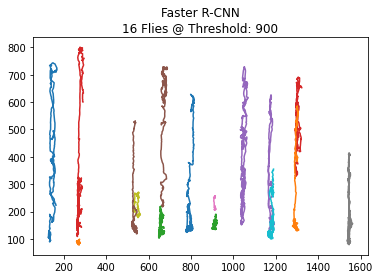

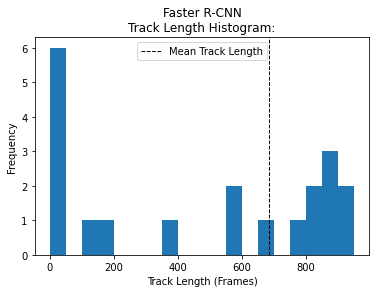

In [ ]:
#Running SORT
#!/usr/bin/env python3
#Took 27 mins to write to video
# -- coding: utf-8 --

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import numpy as np
import tqdm
import cv2
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog
import time


# Extract video properties
video = cv2.VideoCapture(testvid_path)
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Initialize video writer
video_writer = cv2.VideoWriter('tracked_out.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

# Initialize predictor
#cfg = get_cfg()
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
#cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
#predictor = DefaultPredictor(cfg)

# Initialize visualizer
v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), ColorMode.IMAGE)

tracker = Sort(max_age=25000, min_hits=1, iou_threshold=0.01)

def num_uniID(trackers):
    from itertools import chain
    ids = []
    for frm in trackers:
        frm_ids = []
        for fly in frm:
            flyID = fly[4]
            frm_ids.append(flyID)
        ids.append(frm_ids)
        
    ids = np.array(ids, dtype=object)
        
    return(set(chain(*ids)))

def plot_ID(trackers, ID):
    coords = []
    for frm in trackers:
        gotFly = False
        for fly in frm:
            if int(fly[4]) == ID:
                #gotFly = True
                coords.append((fly[0], fly[1]))
        #if gotFly == False:
        #     pass
    return(coords)
            #coords.append(coords[-1])
    
def plot_tracker(trackers, cascade, threshold = 1000):
    global coords
    coord_lengths = []
    matplotlib.pyplot.figure()
    no_flies = 0
    for ID in num_uniID(trackers):
        coords = plot_ID(trackers, ID)
        coord_lengths.append(len(coords))
        if len(coords) > threshold:
            no_flies +=1
            plt.plot(*zip(*coords))
    print('Number of flies > threshold: ', no_flies)
    matplotlib.pyplot.title(cascade + '\n' + str(no_flies) + ' Flies @ Threshold: ' + str(threshold))
    plt.figure()
    plt.hist(coord_lengths, bins = range(0,1000, 50))
    plt.axvline(np.mean(coord_lengths), color = 'k', linestyle = 'dashed', linewidth = 1, label = 'Mean Track Length')
    print('Mean Track Length = ', np.mean(coord_lengths))
    plt.title(cascade + '\n' + 'Track Length Histogram:')
    plt.xlabel('Track Length (Frames)')
    plt.ylabel('Frequency')
    plt.legend()



def runOnVideo(video, maxFrames):
    global pred_flies, outputs, trackers
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """
    pred_flies = []
    readFrames = 0
    trackers = []
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Get prediction results for this frame
        outputs = predictor(frame)
        pred_flies.append(len(outputs["instances"].pred_classes))

        # Make sure the frame is colored
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Draw a visualization of the predictions using the video visualizer
        visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))
        
        full_array = []
        for i,box in enumerate(outputs["instances"].to('cpu').pred_boxes.tensor.numpy()):
          complete = np.append(box, outputs['instances'].to('cpu').scores.numpy()[i])
          full_array.append(complete)
        full_array = np.array(full_array)
        trackers.append(tracker.update(full_array)) #outputs["instances"].to('cpu').pred_boxes.tensor.numpy())

        #visualization = v.draw_instance_predictions(frame, tracker)


        # Convert Matplotlib RGB format to OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break
    print("number of unique IDs", len(num_uniID(trackers)))
    
    for threshold in range(600, 1000, 100): 
      plot_tracker(trackers, 'Faster R-CNN', threshold)
# Create a cut-off for debugging
num_frames = 1000

# Enumerate the frames of the video
for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

    # Write test image
    cv2.imwrite('POSE detectron2.png', visualization)

    # Write to video file
    video_writer.write(visualization)

# Release resources
video.release()
video_writer.release()
cv2.destroyAllWindows()

#Plotting loss graph

These cells were used to plot a loss graph for the report since it was difficult to get TensorFlow to output the loss graph so long after training the model.

<function matplotlib.pyplot.show>

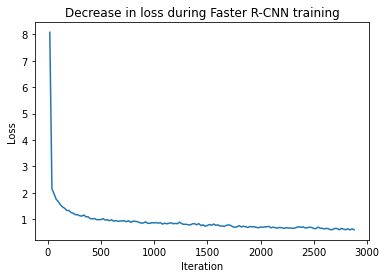

In [ ]:
#Used this at the end of the project to plot a loss curve for the new model's training

import matplotlib.pyplot as plt

loss = [8.081, 2.154, 1.966, 1.757, 1.669, 1.545, 1.468, 1.414, 1.335, 1.329, 1.253, 1.231, 1.174, 1.174, 1.135, 1.119, 1.162, 1.093, 1.093, 1.026, 1.017, 
        1.025, 0.987, 0.985, 0.988, 1.025, 0.970, 0.984, 0.944, 0.982, 0.925, 0.954, 0.924, 0.935, 0.938, 0.942, 0.908, 0.945, 0.881, 0.925, 0.925, 0.912, 
        0.882, 0.852, 0.863, 0.902, 0.850, 0.845, 0.873, 0.861, 0.874, 0.856, 0.868, 0.818, 0.853, 0.829, 0.850, 0.867, 0.830, 0.844, 0.831, 0.891, 0.833, 
        0.807, 0.812, 0.792, 0.784, 0.828, 0.834, 0.790, 0.837, 0.762, 0.791, 0.737, 0.762, 0.802, 0.775, 0.819, 0.772, 0.788, 0.743, 0.745, 0.733, 0.772, 
        0.788, 0.766, 0.716, 0.698, 0.719, 0.757, 0.710, 0.737, 0.717, 0.692, 0.725, 0.713, 0.716, 0.695, 0.676, 0.708, 0.698, 0.707, 0.715, 0.729, 0.675, 
        0.704, 0.678, 0.667, 0.691, 0.678, 0.657, 0.678, 0.671, 0.669, 0.661, 0.662, 0.695, 0.716, 0.696, 0.708, 0.673, 0.683, 0.699, 0.690, 0.654, 0.643, 
        0.703, 0.663, 0.656, 0.638, 0.656, 0.637, 0.602, 0.616, 0.655, 0.650, 0.603, 0.656, 0.627, 0.604, 0.639, 0.597, 0.639, 0.602]
avloss = []
for i, value in enumerate(loss):
  if i == 0 or i == (len(loss)-1):
    avloss.append(loss[i])
    continue
  newloss = (loss[i] + loss[i-1] + loss[i+1]) / 3
  avloss.append(newloss)
iter = []
count = 19
while count <= 2879:
  iter.append(count)
  count += 20
plt.plot(iter, loss)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Decrease in loss during Faster R-CNN training')
plt.show


<function matplotlib.pyplot.show>

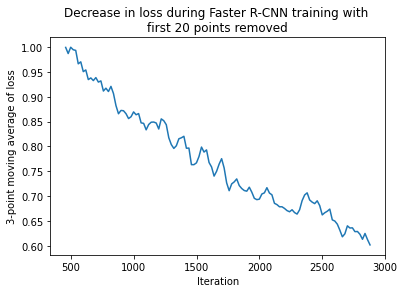

In [ ]:
#Used this to check whether the first few results were hiding that the loss was still decreasing.
plt.plot(iter[22:], avloss[22:])
plt.xlabel('Iteration')
plt.ylabel('3-point moving average of loss')
plt.title('Decrease in loss during Faster R-CNN training with \nfirst 20 points removed')
plt.show

#Evaluation with FiftyOne

These cells were added at the end but relate to the evaluation stage immediately after the training of the model.

In [ ]:
#Installing dependencies for fiftyone evaluation analysis - used to create precision-recall curve
!pip install fiftyone

     |████████████████████████████████| 1.1 MB 8.9 MB/s 
     |████████████████████████████████| 79.9 MB 48 kB/s 
     |████████████████████████████████| 29.2 MB 24 kB/s 
     |████████████████████████████████| 224 kB 73.5 MB/s 
     |████████████████████████████████| 569 kB 58.1 MB/s 
     |████████████████████████████████| 131 kB 71.9 MB/s 
     |████████████████████████████████| 106 kB 71.2 MB/s 
     |████████████████████████████████| 36.7 MB 65 kB/s 
     |████████████████████████████████| 55 kB 4.9 MB/s 
     |████████████████████████████████| 557 kB 75.4 MB/s 
     |████████████████████████████████| 13.2 MB 110 kB/s 
     |████████████████████████████████| 77 kB 8.2 MB/s 
     |████████████████████████████████| 58 kB 8.8 MB/s 
     |████████████████████████████████| 54 kB 4.7 MB/s 
     |████████████████████████████████| 77 kB 9.4 MB/s 
     |████████████████████████████████| 77 kB 9.2 MB/s 
     |████████████████████████████████| 7.8 MB 57.3 MB/s 
     |████████████████████████

In [ ]:
#From here its just preparing the evaluation data for inputting to fiftyone then running fiftyone on evaluation data to obtain a precision-recall curve
import os
import fiftyone as fo

coco_dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path='/content/drive/MyDrive/tracking_project/working_dir/v2/test',
    labels_path="/content/drive/MyDrive/tracking_project/working_dir/v2/test/_annotations.coco.json",
    include_id=True,
    label_field="ground_truth",
    )

# Verify that the class list for our dataset was imported
print(coco_dataset.default_classes)  # ['airplane', 'apple', ...]

print(coco_dataset)

 100% |█████████████████| 135/135 [3.0s elapsed, 0s remaining, 45.4 samples/s]      
['dscdeklcm', 'fly']
Name:        2021.08.23.00.56.02
Media type:  image
Num samples: 135
Persistent:  False
Tags:        []
Sample fields:
    id:                      fiftyone.core.fields.ObjectIdField
    filepath:                fiftyone.core.fields.StringField
    tags:                    fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:                fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.Metadata)
    ground_truth_detections: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    ground_truth_coco_id:    fiftyone.core.fields.IntField


In [ ]:
import fiftyone.utils.coco as fouc
import os

with open("/content/drive/MyDrive/tracking_project/working_dir/v2/run3/output/coco_instances_results.json", 'r') as file:
  predictions = file.read()

#
# Mock COCO predictions, where:
# - `image_id` corresponds to the `coco_id` field of `coco_dataset`
# - `category_id` corresponds to classes in `coco_dataset.default_classes`
#

  
# Add COCO predictions to `predictions` field of dataset
fouc.add_coco_labels(coco_dataset, "predictions", predictions, coco_id_field = 'ground_truth_coco_id')

# Verify that predictions were added to two images
print(coco_dataset.count("predictions"))

135


In [ ]:
results = coco_dataset.evaluate_detections(
    "predictions",
    gt_field= 'ground_truth_detections',
    method="coco",
    eval_key="eval",
    compute_mAP=True,
)

print(results.mAP())

Evaluating detections...
 100% |█████████████████| 135/135 [8.4s elapsed, 0s remaining, 17.4 samples/s]       
Performing IoU sweep...
 100% |█████████████████| 135/135 [17.4s elapsed, 0s remaining, 8.8 samples/s]      
0.5430028181123775


In [ ]:
print("TP: %d" % coco_dataset.sum("eval_tp"))
print("FP: %d" % coco_dataset.sum("eval_fp"))
print("FN: %d" % coco_dataset.sum("eval_fn"))


plot = results.plot_pr_curves(classes=['fly'])
plot.show()

TP: 4076
FP: 836
FN: 133
